In [1]:
# Import the required variables
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
def warn(*args, **kwargs): pass
import warnings
warnings.warn = warn

In [3]:
def num_plot(df, col, title, symb):
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=(8,5),gridspec_kw={"height_ratios": (.2, .8)})
    ax[0].set_title(title,fontsize=18)
    sns.boxplot(x=col, data=df, ax=ax[0])
    ax[0].set(yticks=[])
    sns.histplot(x=col, data=df, ax=ax[1])
    ax[1].set_xlabel(col, fontsize=16)
    plt.axvline(df[col].mean(), color='darkgreen', linewidth=2.2, label='mean=' + str(np.round(df[col].mean(),1)) + symb)
    plt.axvline(df[col].median(), color='red', linewidth=2.2, label='median='+ str(np.round(df[col].median(),1)) + symb)
    plt.axvline(df[col].mode()[0], color='purple', linewidth=2.2, label='mode='+ str(df[col].mode()[0]) + symb)
    plt.legend(bbox_to_anchor=(1, 1.03), ncol=1, fontsize=17, fancybox=True, shadow=True, frameon=True)
    plt.tight_layout()
    plt.show()

In [4]:
sns.set_style("whitegrid")
sns.despine()
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True)
plt.rc("axes", labelweight="bold", labelsize="large", titleweight="bold", titlesize=14, titlepad=10)

<Figure size 432x288 with 0 Axes>

In [6]:
# Read the data
Res_Nonhydro_Capita = pd.read_excel ("../data/processed/Res_Nonhydro_Capita.xlsx", index_col = 0)
SDGs_Ranks_2021 = pd.read_excel ("../data/processed/SDGs_Ranks_2021.xlsx", index_col = 0)
SDGs_Scores_2021 = pd.read_excel ("../data/processed/SDGs_Scores_2021.xlsx", index_col = 0)

In [7]:
Res_Nonhydro_Capita_2021 = Res_Nonhydro_Capita[[2021]]
Res_Nonhydro_Capita_2021= Res_Nonhydro_Capita_2021.rename(columns={ 2021: 'Res_Nonhydro_Capita_2021'})
Res_Nonhydro_Capita_2021

,Res_Nonhydro_Capita_2021
Country,
Afghanistan,1.139890
Algeria,16.641204
Angola,7.753307
Argentina,137.997210
Armenia,5.402285
...,...
"Venezuela, RB",2.721090
Vietnam,7.216691
"Yemen, Rep",18.517979


In [35]:
# columns_SDGs_Ranks_2021 = pd.Series(SDGs_Ranks_2021.columns)
# columns_SDGs_Scores_2021 = pd.Series(SDGs_Scores_2021.columns)
# difference = columns_SDGs_Ranks_2021.compare(columns_SDGs_Scores_2021)
# print("\nDifference between the series: \n",difference)


Difference between the series: 
 Empty DataFrame
Columns: [self, other]
Index: []


In [8]:
SDGs_Ranks_2021 = SDGs_Ranks_2021.iloc[:,1:]
SDGs_Ranks_2021

,SDG1,SDG2,SDG3,SDG4,SDG5,SDG6,SDG7,SDG8,SDG9,SDG10,SDG11,SDG12,SDG13,SDG14,SDG15,SDG16,SDG17
Country,,,,,,,,,,,,,,,,,
Afghanistan,102,114,131,120,136,126,100,137,131,61,133,26,17,108,111,119,126
Algeria,58,94,75,65,96,97,73,101,58,14,105,38,60,95,118,63,18
Angola,132,96,130,128,104,115,114,126,130,115,124,18,32,34,71,122,112
Argentina,60,25,48,53,21,39,33,65,57,97,57,81,76,80,83,82,50
Armenia,71,68,62,67,90,76,14,84,81,73,75,35,49,110,80,28,58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Venezuela, RB",131,126,92,90,69,44,38,63,86,121,122,64,78,51,52,137,68
Vietnam,63,15,83,48,45,64,82,55,62,48,63,19,44,104,129,78,72
"Yemen, Rep",116,131,121,122,137,136,104,131,127,80,127,23,26,13,127,135,99


In [9]:
SDGs_Scores_2021 = SDGs_Scores_2021.iloc[:,1:]
SDGs_Scores_2021

,SDG1,SDG2,SDG3,SDG4,SDG5,SDG6,SDG7,SDG8,SDG9,SDG10,SDG11,SDG12,SDG13,SDG14,SDG15,SDG16,SDG17
Country,,,,,,,,,,,,,,,,,
Afghanistan,63.790201,50.131000,37.098357,57.851217,23.16250,46.3138,64.822500,37.753167,6.546833,65.436978,31.761250,90.816833,99.064667,48.422883,52.9840,52.026667,43.359500
Algeria,96.939000,56.565571,75.578571,91.211000,53.71425,61.0340,86.727000,62.236167,45.405833,91.491000,57.699667,87.711833,90.150667,52.333333,51.4928,70.197700,74.101500
Angola,12.913000,55.424125,37.443571,40.775667,51.27800,53.9610,52.432667,52.485500,7.517000,25.246500,46.711750,92.220167,96.520333,66.932000,64.7534,50.653600,47.766000
Argentina,95.990000,67.543125,80.600000,95.269667,80.98550,79.0636,92.506667,70.275500,45.665000,38.402000,81.004500,76.391667,86.248667,57.281000,60.6662,65.167667,64.512750
Armenia,93.438000,60.728143,77.907214,90.329000,57.48825,68.9572,94.821333,66.279400,34.402667,55.069000,76.444750,88.684667,93.073333,48.422883,61.7920,80.024778,62.190750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Venezuela, RB",13.244000,43.225857,65.286786,82.244667,66.27800,78.1348,92.112000,70.762800,32.317333,21.608000,47.579667,81.572500,85.692000,64.511667,69.0270,34.133778,60.782000
Vietnam,95.142500,71.032625,72.467429,97.107667,72.20325,73.1380,83.200333,72.149167,43.975667,70.499500,80.116250,91.899667,93.970000,49.192167,46.6890,65.960000,59.681250
"Yemen, Rep",33.737578,40.703714,44.696429,55.689000,13.44000,38.4338,60.905000,49.294667,8.940167,48.930500,42.881500,91.545833,97.464000,77.505000,47.7480,37.058500,51.118333


# Res_Nonhydro_Capita_2021


In [10]:
Res_Nonhydro_Capita_2021

,Res_Nonhydro_Capita_2021
Country,
Afghanistan,1.139890
Algeria,16.641204
Angola,7.753307
Argentina,137.997210
Armenia,5.402285
...,...
"Venezuela, RB",2.721090
Vietnam,7.216691
"Yemen, Rep",18.517979


In [11]:
percent_missing = Res_Nonhydro_Capita_2021.isnull().sum() * 100 / len(Res_Nonhydro_Capita_2021)
print('Percentage of Missing Data', percent_missing )

Percentage of Missing Data Res_Nonhydro_Capita_2021    0.0
dtype: float64


In [12]:
Res_Nonhydro_Capita_2021.describe()

,Res_Nonhydro_Capita_2021
count,137.000000
mean,607.726471
std,1594.037931
min,0.000000
25%,6.872555
50%,99.450162
75%,610.209358
max,16486.834541


In [13]:
Res_Nonhydro_Capita_2021.info()

<class 'pandas.core.frame.DataFrame'>
Index: 137 entries, Afghanistan to Zimbabwe
Data columns (total 1 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Res_Nonhydro_Capita_2021  137 non-null    float64
dtypes: float64(1)
memory usage: 2.1+ KB


In [14]:
Res_Nonhydro_Capita_2021_backup = Res_Nonhydro_Capita_2021.copy()
median = Res_Nonhydro_Capita_2021['Res_Nonhydro_Capita_2021'].median()
#Sustainability['Wealthy'] = Sustainability.Res_FT_FDI_CumSum.map(lambda x: 1 if x >= median else 0)
Res_Nonhydro_Capita_2021['Res_Nonhydro_Capita_2021'] = Res_Nonhydro_Capita_2021.Res_Nonhydro_Capita_2021.map(lambda x: 1 if x >= median else 0)
Res_Nonhydro_Capita_2021 = Res_Nonhydro_Capita_2021.rename(columns={'Res_Nonhydro_Capita_2021': 'Wealthy'})
Res_Nonhydro_Capita_2021


,Wealthy
Country,
Afghanistan,0
Algeria,0
Angola,0
Argentina,1
Armenia,0
...,...
"Venezuela, RB",0
Vietnam,0
"Yemen, Rep",0


In [15]:
Res_Nonhydro_Capita_2021.describe()

,Wealthy
count,137.000000
mean,0.503650
std,0.501821
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,1.000000


In [136]:
#df = pd.DataFrame({'email':Res_Nonhydro_Capita_2021.index, 'list':Res_Nonhydro_Capita_2021.values})
# df = Res_Nonhydro_Capita_2021.to_frame(name = 'Wealthy')
# df.describe()

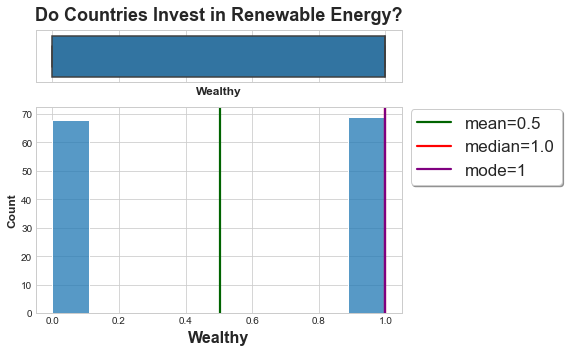

In [16]:
num_plot(Res_Nonhydro_Capita_2021, 'Wealthy', 'Do Countries Invest in Renewable Energy?', '' ) 

#### Is balanced? Yes

In [17]:
(Res_Nonhydro_Capita_2021['Wealthy'] == 1).sum()

69

In [18]:
(Res_Nonhydro_Capita_2021['Wealthy'] == 0).sum()

68

# Append target to the two datasets

In [19]:
SDGs_Ranks_2021 = pd.concat([SDGs_Ranks_2021, Res_Nonhydro_Capita_2021], axis=1)
SDGs_Ranks_2021


,SDG1,SDG2,SDG3,SDG4,SDG5,SDG6,SDG7,SDG8,SDG9,SDG10,SDG11,SDG12,SDG13,SDG14,SDG15,SDG16,SDG17,Wealthy
Country,,,,,,,,,,,,,,,,,,
Afghanistan,102,114,131,120,136,126,100,137,131,61,133,26,17,108,111,119,126,0
Algeria,58,94,75,65,96,97,73,101,58,14,105,38,60,95,118,63,18,0
Angola,132,96,130,128,104,115,114,126,130,115,124,18,32,34,71,122,112,0
Argentina,60,25,48,53,21,39,33,65,57,97,57,81,76,80,83,82,50,1
Armenia,71,68,62,67,90,76,14,84,81,73,75,35,49,110,80,28,58,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Venezuela, RB",131,126,92,90,69,44,38,63,86,121,122,64,78,51,52,137,68,0
Vietnam,63,15,83,48,45,64,82,55,62,48,63,19,44,104,129,78,72,0
"Yemen, Rep",116,131,121,122,137,136,104,131,127,80,127,23,26,13,127,135,99,0


In [20]:
SDGs_Scores_2021 = pd.concat([SDGs_Scores_2021, Res_Nonhydro_Capita_2021], axis=1)
SDGs_Scores_2021

,SDG1,SDG2,SDG3,SDG4,SDG5,SDG6,SDG7,SDG8,SDG9,SDG10,SDG11,SDG12,SDG13,SDG14,SDG15,SDG16,SDG17,Wealthy
Country,,,,,,,,,,,,,,,,,,
Afghanistan,63.790201,50.131000,37.098357,57.851217,23.16250,46.3138,64.822500,37.753167,6.546833,65.436978,31.761250,90.816833,99.064667,48.422883,52.9840,52.026667,43.359500,0
Algeria,96.939000,56.565571,75.578571,91.211000,53.71425,61.0340,86.727000,62.236167,45.405833,91.491000,57.699667,87.711833,90.150667,52.333333,51.4928,70.197700,74.101500,0
Angola,12.913000,55.424125,37.443571,40.775667,51.27800,53.9610,52.432667,52.485500,7.517000,25.246500,46.711750,92.220167,96.520333,66.932000,64.7534,50.653600,47.766000,0
Argentina,95.990000,67.543125,80.600000,95.269667,80.98550,79.0636,92.506667,70.275500,45.665000,38.402000,81.004500,76.391667,86.248667,57.281000,60.6662,65.167667,64.512750,1
Armenia,93.438000,60.728143,77.907214,90.329000,57.48825,68.9572,94.821333,66.279400,34.402667,55.069000,76.444750,88.684667,93.073333,48.422883,61.7920,80.024778,62.190750,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Venezuela, RB",13.244000,43.225857,65.286786,82.244667,66.27800,78.1348,92.112000,70.762800,32.317333,21.608000,47.579667,81.572500,85.692000,64.511667,69.0270,34.133778,60.782000,0
Vietnam,95.142500,71.032625,72.467429,97.107667,72.20325,73.1380,83.200333,72.149167,43.975667,70.499500,80.116250,91.899667,93.970000,49.192167,46.6890,65.960000,59.681250,0
"Yemen, Rep",33.737578,40.703714,44.696429,55.689000,13.44000,38.4338,60.905000,49.294667,8.940167,48.930500,42.881500,91.545833,97.464000,77.505000,47.7480,37.058500,51.118333,0


# SDGs_Ranks_2021

In [21]:
SDGs_Ranks_2021.describe()

,SDG1,SDG2,SDG3,SDG4,SDG5,SDG6,SDG7,SDG8,SDG9,SDG10,SDG11,SDG12,SDG13,SDG14,SDG15,SDG16,SDG17,Wealthy
count,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000
mean,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,0.503650
std,39.692569,39.692569,39.692569,39.692569,39.692569,39.692569,39.692569,39.692569,39.692569,39.692569,39.692569,39.692569,39.692569,39.692569,39.692569,39.692569,39.692569,0.501821
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
25%,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,0.000000
50%,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,1.000000
75%,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,1.000000
max,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,1.000000


In [22]:
SDGs_Ranks_2021.info()

<class 'pandas.core.frame.DataFrame'>
Index: 137 entries, Afghanistan to Zimbabwe
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   SDG1     137 non-null    int64
 1   SDG2     137 non-null    int64
 2   SDG3     137 non-null    int64
 3   SDG4     137 non-null    int64
 4   SDG5     137 non-null    int64
 5   SDG6     137 non-null    int64
 6   SDG7     137 non-null    int64
 7   SDG8     137 non-null    int64
 8   SDG9     137 non-null    int64
 9   SDG10    137 non-null    int64
 10  SDG11    137 non-null    int64
 11  SDG12    137 non-null    int64
 12  SDG13    137 non-null    int64
 13  SDG14    137 non-null    int64
 14  SDG15    137 non-null    int64
 15  SDG16    137 non-null    int64
 16  SDG17    137 non-null    int64
 17  Wealthy  137 non-null    int64
dtypes: int64(18)
memory usage: 20.3+ KB


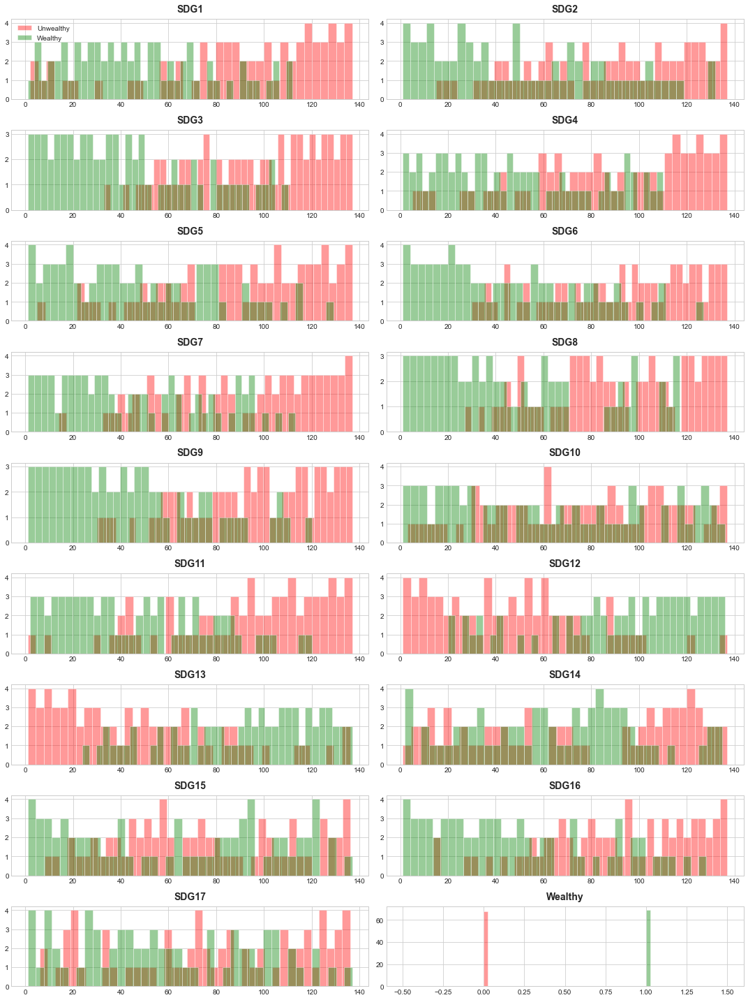

In [23]:
fig, axes = plt.subplots(9,2, figsize=(15,20))
Unwealthy = SDGs_Ranks_2021[SDGs_Ranks_2021['Wealthy']==0]
Wealthy = SDGs_Ranks_2021[SDGs_Ranks_2021['Wealthy']==1]
axes = axes.ravel()
for i in range(len(SDGs_Ranks_2021.columns)):
    axes[i].hist(Unwealthy.values[:,i], bins = 40, color='r',alpha=0.4)
    axes[i].hist(Wealthy.values[:,i],bins = 40, color='g',alpha=0.4)
    axes[i].set_title(SDGs_Ranks_2021.columns[i])

axes[0].legend(['Unwealthy','Wealthy']);

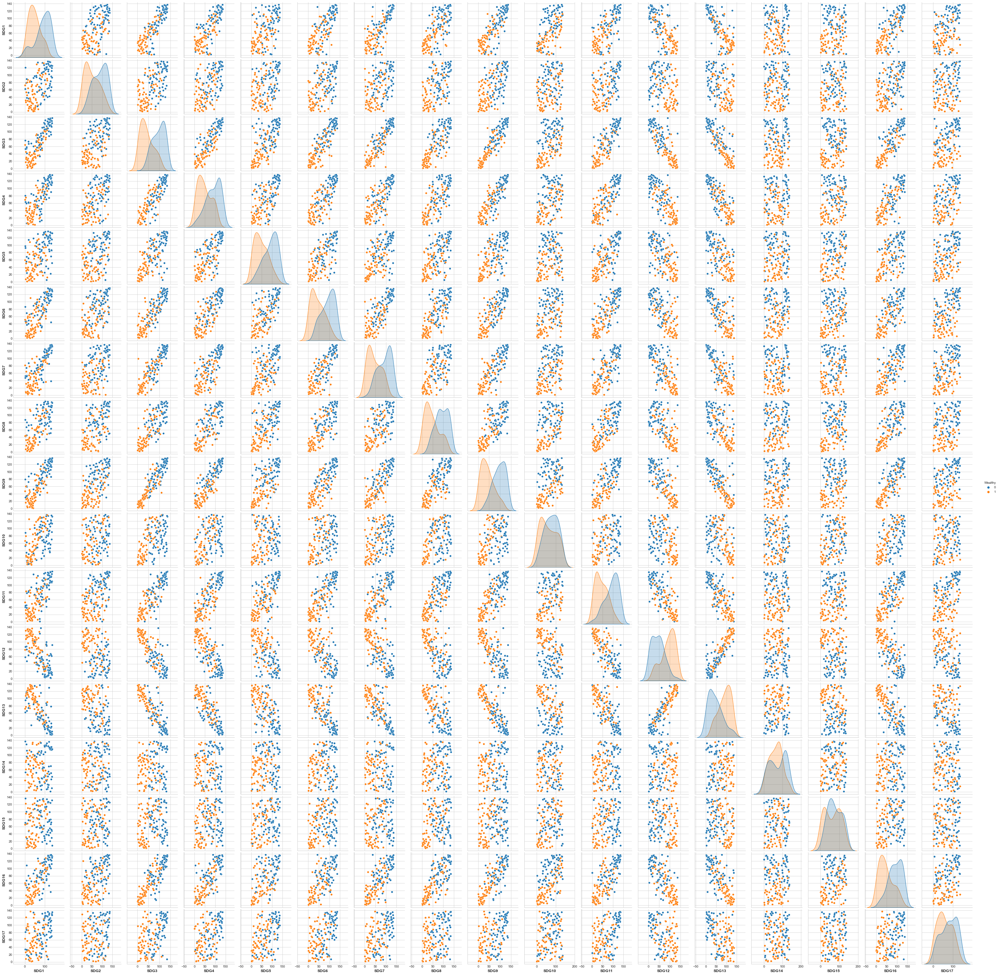

In [24]:
sns.pairplot(SDGs_Ranks_2021, hue='Wealthy')

### Not so skewed, do not perform log

In [26]:
# skewness > 1 highly positively skewed.
# skewness < -1 highly negatively skewed.
SDGs_Ranks_2021.skew()

SDG1       0.000000
SDG2       0.000000
SDG3       0.000000
SDG4       0.000000
SDG5       0.000000
SDG6       0.000000
SDG7       0.000000
SDG8       0.000000
SDG9       0.000000
SDG10      0.000000
SDG11      0.000000
SDG12      0.000000
SDG13      0.000000
SDG14      0.000000
SDG15      0.000000
SDG16      0.000000
SDG17      0.000000
Wealthy   -0.014761
dtype: float64

# SDGs_Scores_2021

In [27]:
SDGs_Scores_2021.describe()

,SDG1,SDG2,SDG3,SDG4,SDG5,SDG6,SDG7,SDG8,SDG9,SDG10,SDG11,SDG12,SDG13,SDG14,SDG15,SDG16,SDG17,Wealthy
count,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000
mean,76.933741,59.251054,71.308284,81.969209,62.731135,69.808344,74.652664,69.457345,45.694995,55.565438,73.120271,75.442102,81.434487,59.575779,65.998077,67.960566,59.813519,0.503650
std,30.047675,10.367644,19.268882,21.651808,16.976046,14.564482,25.902565,11.249896,27.633170,26.893131,17.981620,16.939322,19.123736,12.584655,13.762018,13.771513,12.168576,0.501821
min,0.000000,24.608000,16.026071,3.733667,13.440000,32.705400,1.058500,37.753167,3.526000,0.000000,19.243000,21.236833,10.024333,22.453040,26.426500,34.133778,33.001000,0.000000
25%,59.576500,52.445250,56.384385,71.336000,51.598000,58.629800,61.385333,62.102000,24.056667,36.501007,58.692000,63.056500,72.595333,50.081000,55.689000,57.896000,50.655500,0.000000
50%,93.629500,60.464250,77.103154,89.767667,66.278000,72.011000,88.004667,69.979833,39.716167,58.437000,78.850250,80.468333,87.526000,60.304000,65.652250,68.168600,60.627500,1.000000
75%,99.465500,66.169125,85.931071,98.160708,74.949750,80.404200,92.343000,78.137333,66.500833,75.537000,86.655250,88.684667,95.896333,66.808500,76.042200,78.173000,69.600750,1.000000
max,100.000000,82.463250,96.823846,99.783333,91.371000,94.953200,99.714500,88.855500,98.784667,100.000000,100.000000,96.036000,99.802000,85.254833,97.858400,94.601800,96.698000,1.000000


In [28]:
SDGs_Scores_2021.info()

<class 'pandas.core.frame.DataFrame'>
Index: 137 entries, Afghanistan to Zimbabwe
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   SDG1     137 non-null    float64
 1   SDG2     137 non-null    float64
 2   SDG3     137 non-null    float64
 3   SDG4     137 non-null    float64
 4   SDG5     137 non-null    float64
 5   SDG6     137 non-null    float64
 6   SDG7     137 non-null    float64
 7   SDG8     137 non-null    float64
 8   SDG9     137 non-null    float64
 9   SDG10    137 non-null    float64
 10  SDG11    137 non-null    float64
 11  SDG12    137 non-null    float64
 12  SDG13    137 non-null    float64
 13  SDG14    137 non-null    float64
 14  SDG15    137 non-null    float64
 15  SDG16    137 non-null    float64
 16  SDG17    137 non-null    float64
 17  Wealthy  137 non-null    int64  
dtypes: float64(17), int64(1)
memory usage: 20.3+ KB


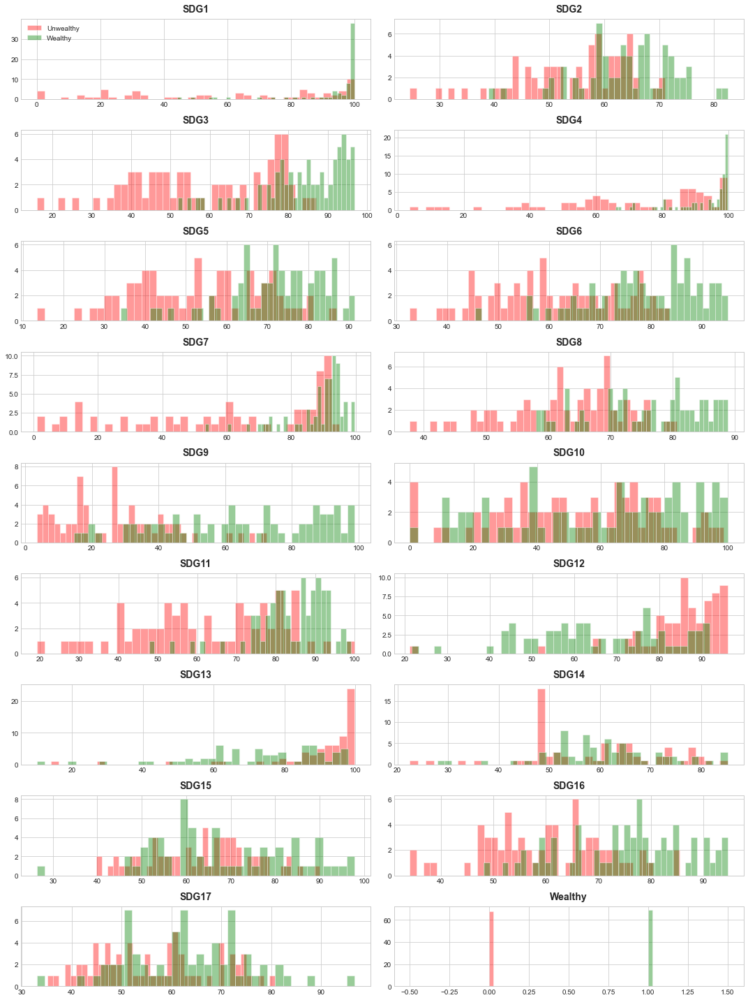

In [29]:
fig, axes = plt.subplots(9,2, figsize=(15,20))
Unwealthy = SDGs_Scores_2021[SDGs_Scores_2021['Wealthy']==0]
Wealthy = SDGs_Scores_2021[SDGs_Scores_2021['Wealthy']==1]
axes = axes.ravel()
for i in range(len(SDGs_Scores_2021.columns)):
    axes[i].hist(Unwealthy.values[:,i], bins = 40, color='r',alpha=0.4)
    axes[i].hist(Wealthy.values[:,i],bins = 40, color='g',alpha=0.4)
    axes[i].set_title(SDGs_Scores_2021.columns[i])

axes[0].legend(['Unwealthy','Wealthy']);

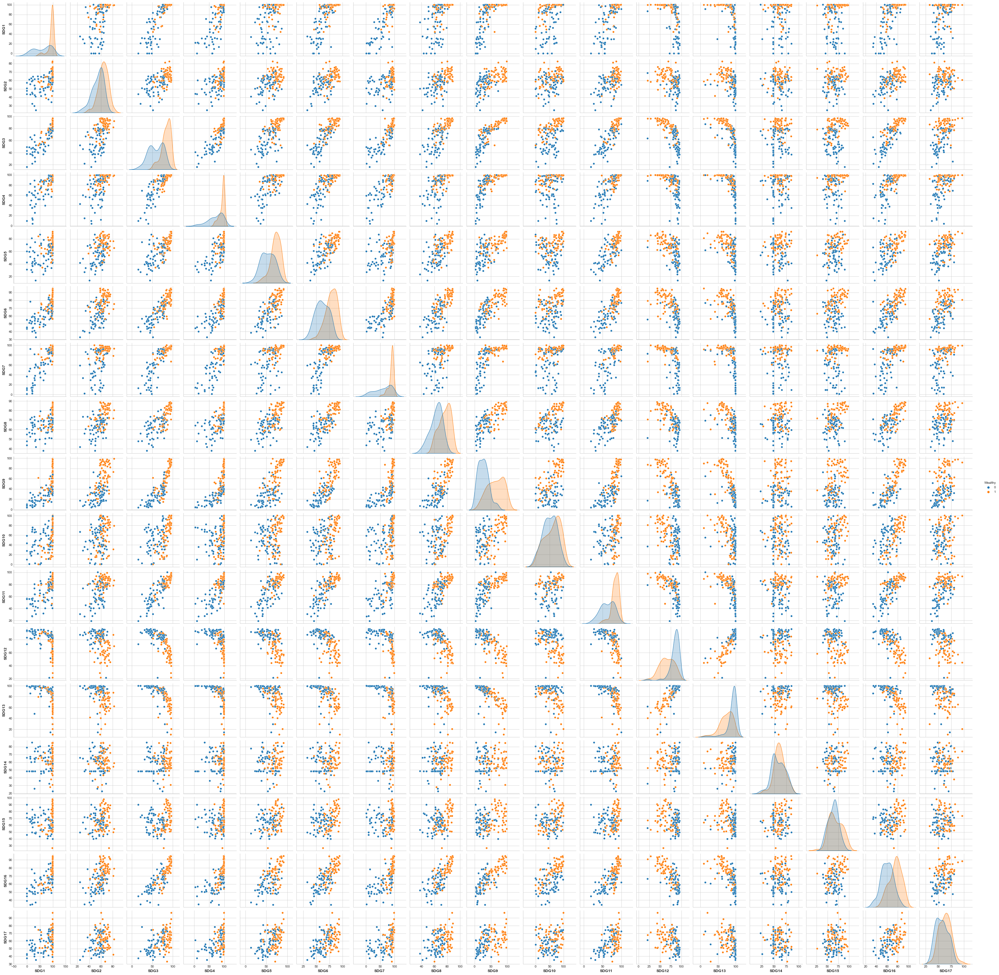

In [30]:
sns.pairplot(SDGs_Scores_2021, hue='Wealthy')

### Not so skewed, do not perform log

In [31]:
# skewness > 1 highly positively skewed.
# skewness < -1 highly negatively skewed.
SDGs_Scores_2021.skew()

SDG1      -1.194947
SDG2      -0.690069
SDG3      -0.708784
SDG4      -1.628691
SDG5      -0.527272
SDG6      -0.329724
SDG7      -1.392693
SDG8      -0.335587
SDG9       0.398194
SDG10     -0.233131
SDG11     -0.887099
SDG12     -1.002256
SDG13     -1.503762
SDG14     -0.209898
SDG15      0.155067
SDG16     -0.119865
SDG17      0.160987
Wealthy   -0.014761
dtype: float64

# Correlation Tables

<AxesSubplot:>

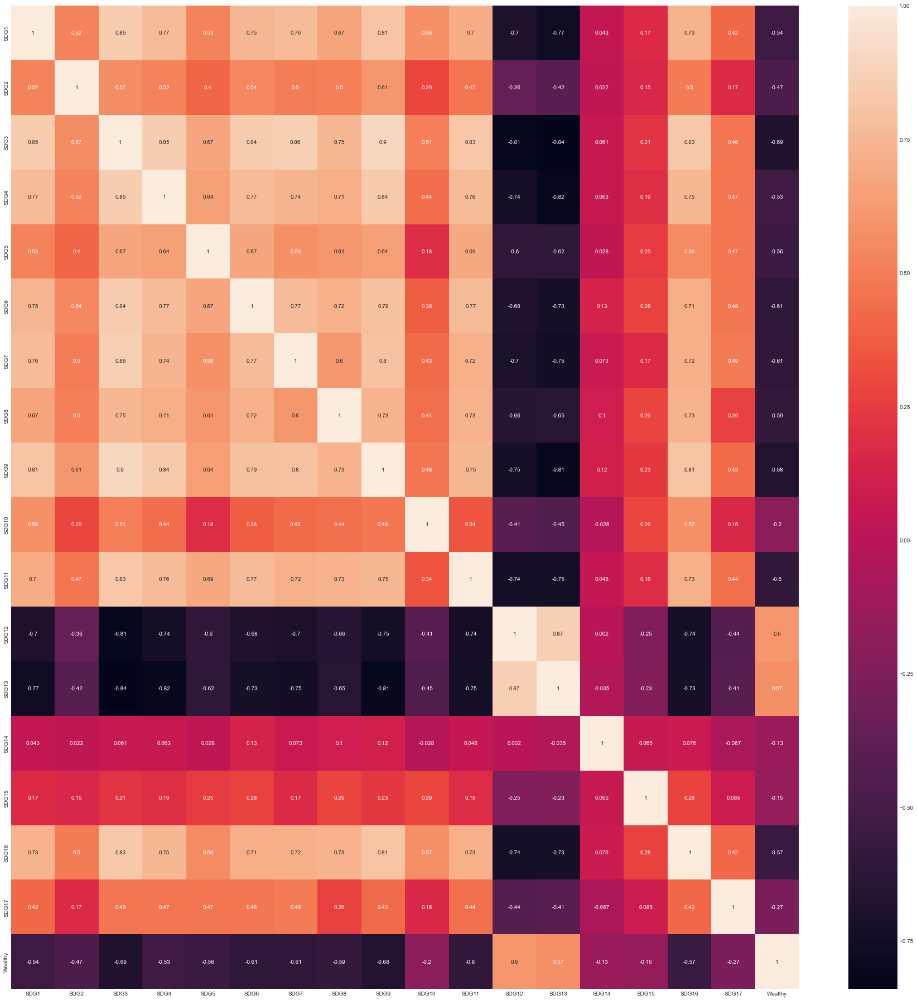

In [32]:
plt.figure(figsize=(25,25))
sns.heatmap(SDGs_Ranks_2021.corr(), annot=True)

<AxesSubplot:>

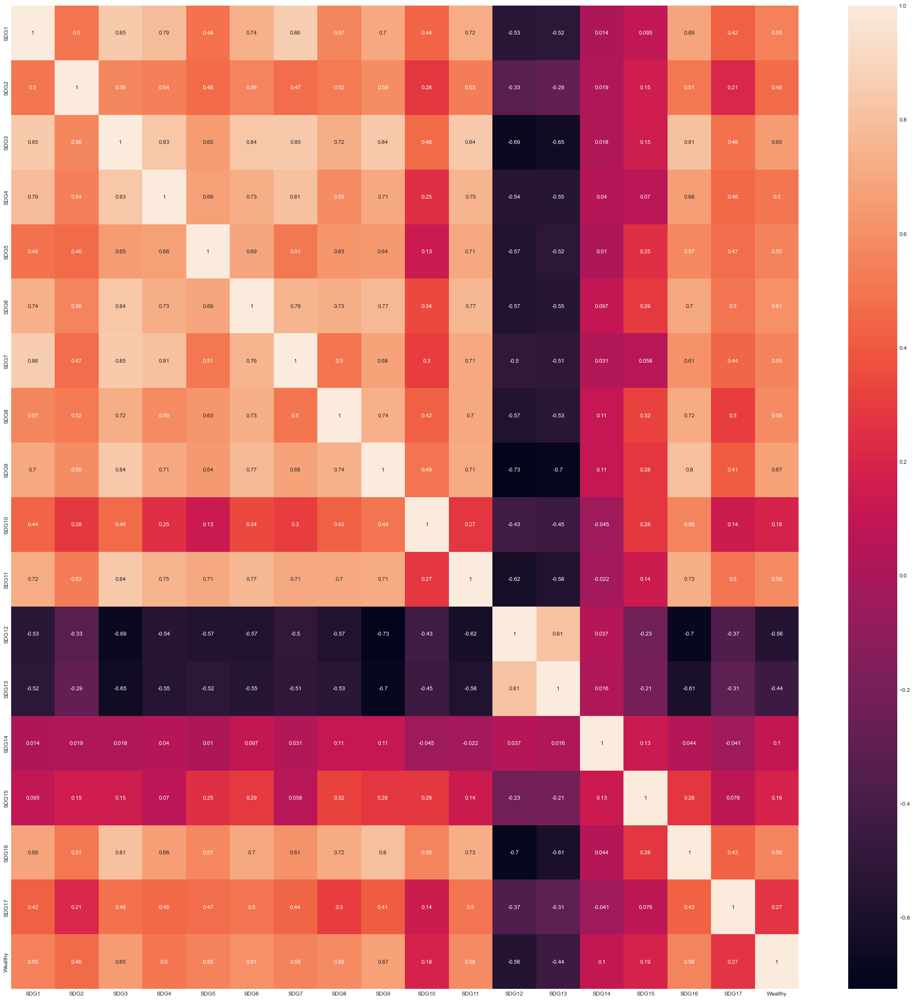

In [33]:
plt.figure(figsize=(25,25))
sns.heatmap(SDGs_Scores_2021.corr(), annot=True)

# Predicciones - SDGs_Scores_2021
1. Divide en train y test
2. Prepara un pipeline compuesto por:
    - StandardScaler,
    - PCA de 5 componentes
    - KNN con 3 vecinos
3. Entrena
4. Predice en test
5. Calcula el accuracy score en train y test
6. Representa la matriz de confusión
7. ¿Qué combinación de vecinos y componentes mejoraría el accuracy en test?
8. Guarda tu modelo

In [34]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

X = SDGs_Scores_2021.drop('Wealthy',1)
y = SDGs_Scores_2021['Wealthy']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [35]:
pipeline = Pipeline(steps = [
    ("scaler", StandardScaler()), # primero escalo
    ("pca", PCA()), # segundo aplica PCA 
    ("kneighborsclassifier", KNeighborsClassifier()) # Despues un KNeighborsClassifier
])

pipeline_param = {
    'pca__n_components' :  list(range(1,17)),
    'kneighborsclassifier__n_neighbors' :  list(range(1,50))
}

gs_pipeline = GridSearchCV(pipeline,
                            pipeline_param,
                             cv = 10,
                            scoring = 'accuracy',
                            verbose = 1, # mensajes del output
                            n_jobs = -1)

grids = {"gs_pipeline": gs_pipeline}

for nombre, grid_search in grids.items():
    grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 784 candidates, totalling 7840 fits


In [36]:
print(gs_pipeline.best_score_)
print(gs_pipeline.best_params_)
print(gs_pipeline.best_estimator_)

0.889090909090909
{'kneighborsclassifier__n_neighbors': 11, 'pca__n_components': 2}
Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=2)),
                ('kneighborsclassifier', KNeighborsClassifier(n_neighbors=11))])


In [37]:
print("Accuracy train", gs_pipeline.best_estimator_.score(X_train, y_train))
print("Accuracy test", gs_pipeline.best_estimator_.score(X_test, y_test))

Accuracy train 0.8807339449541285
Accuracy test 0.8214285714285714


## MEJOR MODEL
* n_neighbors 11
* n_components 2
* Accuracy train 0.8807339449541285
* Accuracy test 0.8214285714285714

In [187]:
import pickle

with open('model_v1', 'wb') as archivo_salida:
    pickle.dump(gs_pipeline.best_estimator_, archivo_salida)

In [188]:
with open('model_v1', 'rb') as archivo_entrada:
    loaded_model = pickle.load(archivo_entrada)

In [189]:
loaded_model.score(X_test,y_test)

0.8214285714285714

In [171]:
test_csv = pd.concat([X_test, y_test], axis=1)
test_csv

,SDG1,SDG2,SDG3,SDG4,SDG5,SDG6,SDG7,SDG8,SDG9,SDG10,SDG11,SDG12,SDG13,SDG14,SDG15,SDG16,SDG17,Wealthy
Country,,,,,,,,,,,,,,,,,,
Portugal,99.3815,64.104500,90.954769,99.003333,83.272750,84.13680,95.022667,82.155333,75.417667,69.697000,88.422000,63.056500,75.819667,43.065000,72.673000,88.067700,62.678750,1
Poland,99.4655,68.159875,85.269923,98.298667,72.180000,84.91120,89.265667,84.405333,71.760000,75.428500,82.428000,75.869333,75.097000,65.122000,92.320000,81.448200,62.381000,1
Belize,55.3460,59.362571,72.339308,77.694333,56.378250,75.87380,92.313500,58.470200,22.748000,36.501007,79.086000,72.233000,91.131667,67.917600,54.174400,60.812125,71.505000,1
Central African Republic,0.0000,43.645500,16.026071,9.207000,30.888250,45.51140,12.827500,47.698000,3.526000,9.641000,19.243000,72.737667,99.673000,48.160239,89.913800,44.737000,37.324333,0
Turkey,99.6240,65.068000,82.928000,96.273000,46.329750,75.12840,89.161000,59.060667,60.301500,38.105000,73.987500,79.810833,86.967667,51.998167,53.259400,66.496444,71.963250,1
Italy,98.0600,71.018625,94.043000,96.708333,72.829000,82.13500,93.847333,76.572000,83.604500,71.545000,82.341250,63.609667,76.820000,53.541167,80.221400,78.989500,62.952750,1
Ireland,99.7950,75.894875,93.231846,99.738708,76.390250,87.28540,93.429333,87.328600,82.017000,86.423000,88.755250,45.179000,58.196333,71.895167,89.083000,90.434333,51.307750,1
Sri Lanka,91.5440,62.129625,77.814571,97.413667,52.004250,56.62700,66.947667,76.219500,34.159167,36.333000,82.970667,85.360167,95.152000,71.716500,55.946600,66.226400,49.136000,0
Vietnam,95.1425,71.032625,72.467429,97.107667,72.203250,73.13800,83.200333,72.149167,43.975667,70.499500,80.116250,91.899667,93.970000,49.192167,46.689000,65.960000,59.681250,0


In [172]:
test_csv.to_csv('test.csv', index = True)

In [173]:
import json
  
# Data to be written
dictionary ={
    "nombre_alumno" : "Miguel Chamochin",
    "titulo" : "Conectando los Objetivos de Desarrollo Sostenible con el cambio climático y la transición energética",
    "tipo_ml" : "O",
    "target" : "Wealthy"
}
  
with open("info.json", "w") as outfile:
    json.dump(dictionary, outfile)

# Predicciones - SDGs_Ranks_2021

In [190]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

X = SDGs_Ranks_2021.drop('Wealthy',1)
y = SDGs_Ranks_2021['Wealthy']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [191]:
pipeline = Pipeline(steps = [
    ("scaler", StandardScaler()), # primero escalo
    ("pca", PCA()), # segundo aplica PCA 
    ("kneighborsclassifier", KNeighborsClassifier()) # Despues un KNeighborsClassifier
])

pipeline_param = {
    'pca__n_components' :  list(range(1,17)),
    'kneighborsclassifier__n_neighbors' :  list(range(1,50))
}

gs_pipeline = GridSearchCV(pipeline,
                            pipeline_param,
                             cv = 10,
                            scoring = 'accuracy',
                            verbose = 1, # mensajes del output
                            n_jobs = -1)

grids = {"gs_pipeline": gs_pipeline}

for nombre, grid_search in grids.items():
    grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 784 candidates, totalling 7840 fits


In [192]:
print(gs_pipeline.best_score_)
print(gs_pipeline.best_params_)
print(gs_pipeline.best_estimator_)

0.8890909090909093
{'kneighborsclassifier__n_neighbors': 1, 'pca__n_components': 10}
Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=10)),
                ('kneighborsclassifier', KNeighborsClassifier(n_neighbors=1))])


In [193]:
print("Accuracy train", gs_pipeline.best_estimator_.score(X_train, y_train))
print("Accuracy test", gs_pipeline.best_estimator_.score(X_test, y_test))

Accuracy train 1.0
Accuracy test 0.6785714285714286


# CONCLUSION